# **Tutorial**

# **Painting Similarity: Multi-Model Embedding for General and Face Similarity in Paintings**
This tutorial explores a hybrid approach to retrieving similar paintings using multi-modal deep learning embeddings. By combining ArcFace (identity-based features), DINOv2 (deep visual features), and CLIP (semantic text-image similarity), we achieve robust similarity search. The system enhances images, extracts embeddings, and efficiently retrieves related paintings using FAISS.

* Face detection & preprocessing enhancements
* Multi-model embedding extraction (ArcFace, DINOv2, CLIP)
* Fast and scalable similarity retrieval with FAISS


In [ ]:
!pip install -r requirements.txt

In [ ]:
import os
import random
import torch
import pandas as pd
import matplotlib.pyplot as plt
from torchvision import transforms
from tqdm import tqdm

from PIL import Image, UnidentifiedImageError
from utils.image_downloader import ImageDownloader
from utils.image_dataset import OptimizedImageDataset
from models import hybrid_face_similarity
from models.hybrid_face_similarity import HybridFaceSimilarity
from utils.hybrid_retrieval import HybridImageRetrieval


Using device: cuda
Loaded 210770 rows from objects_dimensions.csv
Loaded 106609 rows from published_images.csv
Initializing download...
objects_dimensions.csv downloaded successfully!
published_images.csv downloaded successfully!
Found 156 valid images to download.


100%|██████████| 156/156 [00:05<00:00, 30.00it/s]


0 images failed to download.
156 valid images downloaded successfully.
Total downloaded images: 156


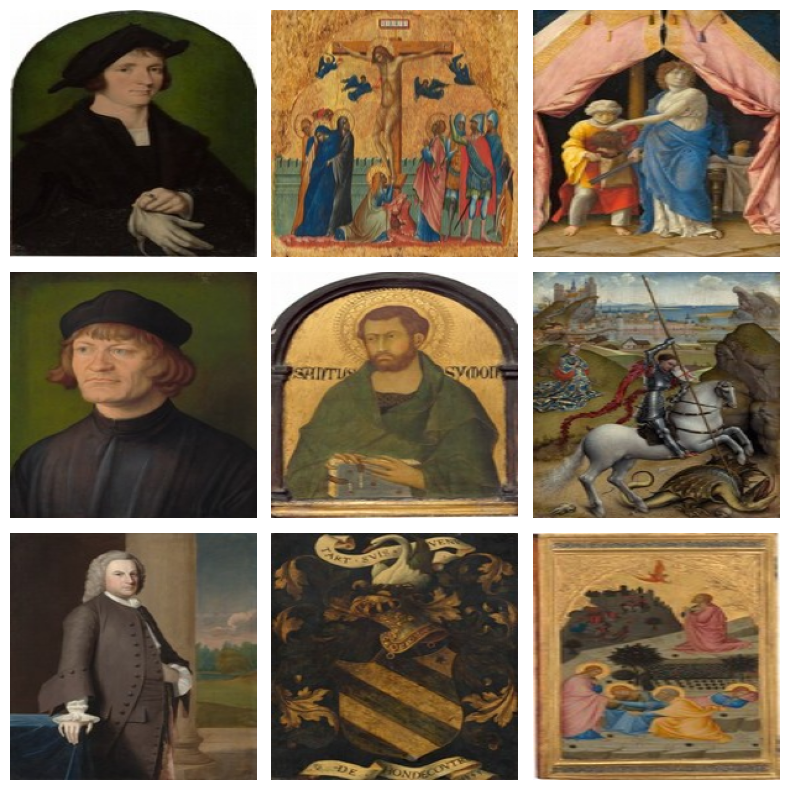

In [ ]:


# Check if GPU is available
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"Using device: {device}")

# Set paths
curr_path = os.getcwd()
loader_root = os.path.join(curr_path, "data")
folder_path = os.path.join(loader_root, "images")

# CSV paths from Kaggle dataset
csv_path_objects = "/kaggle/input/the-national-gallery-of-art-open-data-program/opendata-main/data/objects_dimensions.csv"
csv_path_images = "/kaggle/input/the-national-gallery-of-art-open-data-program/opendata-main/data/published_images.csv"

# Initialize ImageDownloader
downloader = ImageDownloader(loader_root)

# Load CSVs
objects_df = pd.read_csv(csv_path_objects)
images_df = pd.read_csv(csv_path_images)

print(f"Loaded {len(objects_df)} rows from objects_dimensions.csv")
print(f"Loaded {len(images_df)} rows from published_images.csv")

# Download images
percent = 100  # Download all images
downloader.download_painting(percent=percent)

# Check downloaded images
image_files = [f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))]
print(f"Total downloaded images: {len(image_files)}")

# Create Dataset with OptimizedImageDataset
merged_csv_path = os.path.join(loader_root, "annotations/merged_filtered.csv")
if os.path.exists(merged_csv_path):
    merged_df = pd.read_csv(merged_csv_path)
    dataset = OptimizedImageDataset(dataFrame=merged_df, image_dir=folder_path, augment=False, image_size=(200, 200))
else:
    print(f"Error: {merged_csv_path} not found. Ensure images were downloaded correctly.")
    exit()

# Select 9 random images for display
num_samples = min(9, len(dataset))
selected_indices = random.sample(range(len(dataset)), num_samples)

# Display selected images in a 3x3 grid
fig, axes = plt.subplots(3, 3, figsize=(8, 8))
for i, idx in enumerate(selected_indices):
    img = dataset[idx]
    img = img.permute(1, 2, 0).cpu().numpy() * 0.5 + 0.5  # Denormalize
    axes[i // 3, i % 3].imshow(img)
    axes[i // 3, i % 3].axis('off')

plt.tight_layout()
plt.show()


In [7]:
print(f"Total downloaded images: {len(image_files)}")


Total downloaded images: 156


# **Hybrid Embedding Extractions: (General and Face alligned)**

In [11]:
import os
from PIL import Image

# Load Hybrid Image Retrieval System for General and Face-Cropped Images
hybrid_img_general = HybridImageRetrieval(model_path=None, img_path=folder_path, device=device)
hybrid_img_face = HybridImageRetrieval(model_path=None, img_path=folder_path, device=device)

print("Feature Vector Lists Built for General and Face-Aligned Images!")

# Load Hybrid Face Similarity Model
hybrid_face_sim = HybridFaceSimilarity(device=device)

# Get all image files from the folder
image_extensions = {".jpg", ".jpeg", ".png"}  # Define valid image extensions
sample_images = [
    os.path.join(folder_path, img)
    for img in os.listdir(folder_path)
    if os.path.splitext(img)[1].lower() in image_extensions
]

# ============================
# Extract Hybrid Embeddings for General Images
# ============================
print("🔍 Extracting Hybrid Embeddings for General Images...")
embeddings_general = [
    hybrid_face_sim.hybrid_embedding(Image.open(img))["embedding"]
    for img in sample_images
]
print("Embeddings Extracted for General Images!")

# ============================
# Extract Hybrid Embeddings for Face-Aligned Images
# ============================
print("Extracting Hybrid Embeddings for Face-Aligned Images...")
embeddings_face = []

for img_path in sample_images:
    # Load the image and detect faces
    image = Image.open(img_path)
    faces = hybrid_face_sim.extract_faces(image)

    # If a face is found, use the first detected face for face-aligned embeddings
    if len(faces) > 0:
        face_embedding = hybrid_face_sim.hybrid_embedding(faces[0])["embedding"]
        embeddings_face.append(face_embedding)
    else:
        #print(f"⚠️ No face detected in {img_path}. Using fallback general embedding.")
        # Fallback to general embedding if no face is found
        fallback_embedding = hybrid_face_sim.hybrid_embedding(image)["embedding"]
        embeddings_face.append(fallback_embedding)

print("Embeddings Extracted for Face-Aligned Images!")


download_path: /root/.insightface/models/buffalo_l


100%|██████████| 281857/281857 [00:03<00:00, 89648.51KB/s]


Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/1k3d68.onnx landmark_3d_68 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/2d106det.onnx landmark_2d_106 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/det_10g.onnx detection [1, 3, '?', '?'] 127.5 128.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/genderage.onnx genderage ['None', 3, 96, 96] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/w600k_r50.onnx recognition ['None', 3, 112, 112] 127.5 127.5
set det-size: (640, 640)


/usr/local/lib/python3.10/dist-packages/dinov2/layers/swiglu_ffn.py:43: UserWarning: xFormers is available (SwiGLU)
  warnings.warn("xFormers is available (SwiGLU)")
/usr/local/lib/python3.10/dist-packages/dinov2/layers/attention.py:27: UserWarning: xFormers is available (Attention)
  warnings.warn("xFormers is available (Attention)")
/usr/local/lib/python3.10/dist-packages/dinov2/layers/block.py:33: UserWarning: xFormers is available (Block)
  warnings.warn("xFormers is available (Block)")


config.json:   0%|          | 0.00/4.10k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/599M [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/torch/_utils.py:776: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  return self.fget.__get__(instance, owner)()


preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/905 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/961k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.22M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

🔍 Extracting Features from Images...


 40%|████      | 2/5 [01:22<02:01, 40.59s/it]/usr/local/lib/python3.10/dist-packages/insightface/utils/transform.py:68: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  P = np.linalg.lstsq(X_homo, Y)[0].T # Affine matrix. 3 x 4
<ipython-input-10-72b4e2e6a78f>:188: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:245.)
  batch_faces_tensor = torch.tensor(batch_faces, device=self.device)
100%|██████████| 5/5 [03:09<00:00, 37.81s/it]


⚡ Building FAISS Index...
FAISS Index built successfully with dimension 1792!
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/1k3d68.onnx landmark_3d_68 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/2d106det.onnx landmark_2d_106 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/det_10g.onnx detection [1, 3, '?', '?'] 127.5 128.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/genderage.onnx genderage ['None', 3, 96, 96] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/w600k_r50.onnx recog

/usr/local/lib/python3.10/dist-packages/torch/_utils.py:776: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  return self.fget.__get__(instance, owner)()


🔍 Extracting Features from Images...


 40%|████      | 2/5 [01:13<01:50, 36.97s/it]/usr/local/lib/python3.10/dist-packages/insightface/utils/transform.py:68: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  P = np.linalg.lstsq(X_homo, Y)[0].T # Affine matrix. 3 x 4
100%|██████████| 5/5 [03:02<00:00, 36.41s/it]


⚡ Building FAISS Index...
FAISS Index built successfully with dimension 1792!
✅ Feature Vector Lists Built for General and Face-Aligned Images!
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/1k3d68.onnx landmark_3d_68 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/2d106det.onnx landmark_2d_106 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/det_10g.onnx detection [1, 3, '?', '?'] 127.5 128.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/genderage.onnx genderage ['None', 3, 96, 96] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
fi

/usr/local/lib/python3.10/dist-packages/torch/_utils.py:776: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  return self.fget.__get__(instance, owner)()


🔍 Extracting Hybrid Embeddings for General Images...
✅ Embeddings Extracted for General Images!
🔍 Extracting Hybrid Embeddings for Face-Aligned Images...
✅ Embeddings Extracted for Face-Aligned Images!


In [13]:
print(type(embeddings_general))
print(type(embeddings_general[0])) 


<class 'list'>
<class 'torch.Tensor'>


# **Evaluation**

# **Retrieving and Visualizing Similar Paintings**

General Similarity:


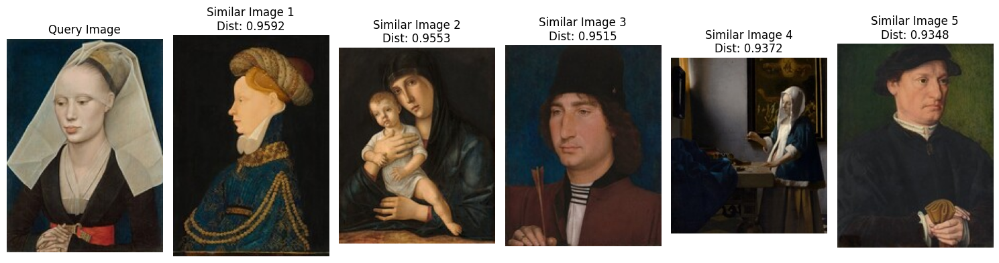

Face based Similarity:


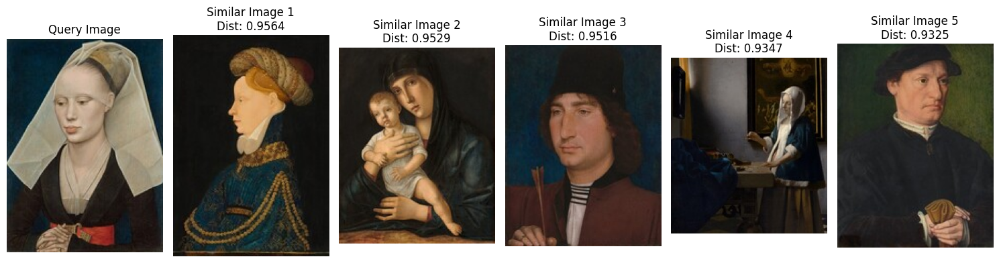

In [35]:
# Define the query image path
query_image1 = "/kaggle/working/data/images/51.jpg"

# Retrieve similar images using the HybridImageRetrieval instance
similar_images1 = hybrid_img_general.retrieve_similar_images(query_image1, metric="cosine")
print("General Similarity:")
# Visualize the results
hybrid_img_general.visualize_results(similar_images1, query_image1)

# Retrieve similar images using the HybridImageRetrieval instance
similar_images1 = hybrid_img_face.retrieve_similar_images(query_image1, metric="cosine")
print("Face based Similarity:")
# Visualize the results
hybrid_img_face.visualize_results(similar_images1, query_image1)


General Similarity:


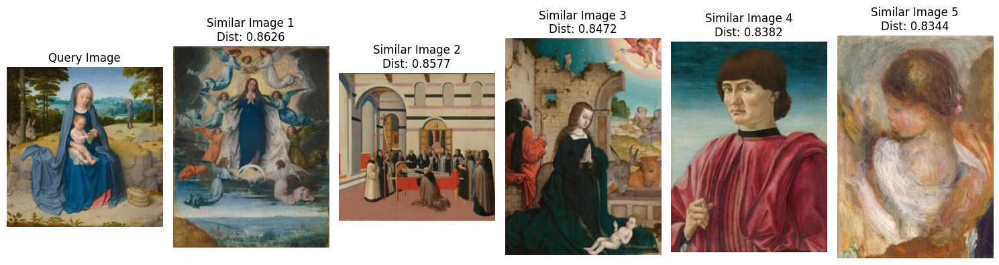

Face based Similarity:


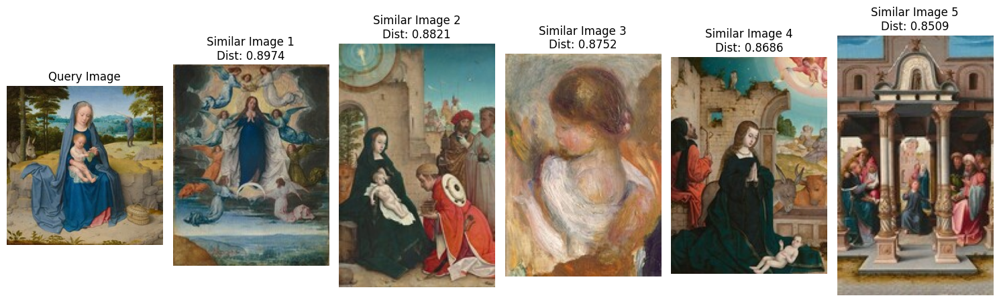

In [36]:

# Define the query image path
query_image1 = "./data/images/50.jpg"

# Retrieve similar images using the HybridImageRetrieval instance
similar_images1 = hybrid_img_general.retrieve_similar_images(query_image1, metric="cosine")
print("General Similarity:")
# Visualize the results
hybrid_img_general.visualize_results(similar_images1, query_image1)

# Retrieve similar images using the HybridImageRetrieval instance
similar_images1 = hybrid_img_face.retrieve_similar_images(query_image1, metric="cosine")
print("Face based Similarity:")
# Visualize the results
hybrid_img_face.visualize_results(similar_images1, query_image1)

General Similarity:


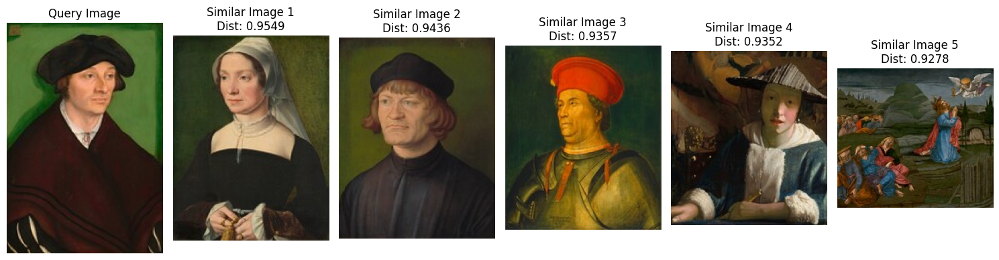

Face based Similarity:


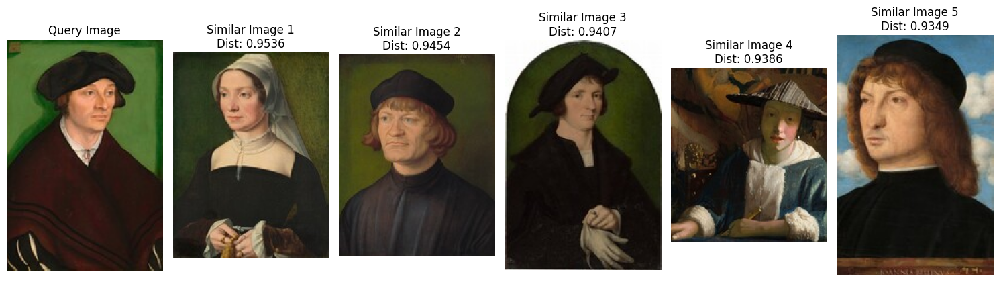

In [27]:
# Define the query image path
query_image1 = "./data/images/45886.jpg"

# Retrieve similar images using the HybridImageRetrieval instance
similar_images1 = hybrid_img_general.retrieve_similar_images(query_image1, metric="cosine")
print("General Similarity:")
# Visualize the results
hybrid_img_general.visualize_results(similar_images1, query_image1)

# Retrieve similar images using the HybridImageRetrieval instance
similar_images1 = hybrid_img_face.retrieve_similar_images(query_image1, metric="cosine")
print("Face based Similarity:")
# Visualize the results
hybrid_img_face.visualize_results(similar_images1, query_image1)

# **Evaluating Painting Similarity with SSIM, RMSE, and LPIPS Metrics**

In [52]:
import lpips

from skimage.metrics import structural_similarity as ssim
from skimage.metrics import mean_squared_error
from skimage.transform import resize
import numpy as np
from PIL import Image

loss_fn = lpips.LPIPS(net='alex').to(device)  # You can also try net='alex'

def calculate_lpips(original_img, similar_img):
    """Calculate LPIPS between original and similar images."""
    if original_img.mode != "RGB":
        original_img = original_img.convert("RGB")
    
    if similar_img.mode != "RGB":
        similar_img = similar_img.convert("RGB")

    transform = transforms.Compose([
        transforms.Resize((224, 224)),  # Resize to match CLIP/DINO
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]),
    ])
    img1_tensor = transform(original_img).unsqueeze(0).to(device)
    img2_tensor = transform(similar_img).unsqueeze(0).to(device)

    with torch.no_grad():
        lpips_score = loss_fn(img1_tensor, img2_tensor).item()

    # Invert to align with SSIM where higher is better
    #lpips_score = 1 / (1 + lpips_score)  # Maps LPIPS to (0,1) where higher = better
    return lpips_score


def calculate_metrics(original_img, similar_img):
    """Calculate SSIM and RMSE between original and similar images."""

    # Convert to RGB if not already
    if original_img.mode != "RGB":
        original_img = original_img.convert("RGB")
    
    if similar_img.mode != "RGB":
        similar_img = similar_img.convert("RGB")

    # Resize to a consistent size for better comparison
    target_size = (512,512)
    original_img_arr = np.array(original_img.resize(target_size, Image.Resampling.LANCZOS)).astype(np.float32)
    similar_img_arr = np.array(similar_img.resize(target_size, Image.Resampling.LANCZOS)).astype(np.float32)

    # Normalize to 0-1 range
    original_img_arr /= 255.0
    similar_img_arr /= 255.0

    # Calculate Multi-Channel SSIM (RGB)
    ssim_score = ssim(
        original_img_arr, 
        similar_img_arr, 
        channel_axis=2,  # Multi-channel SSIM
        data_range=original_img_arr.max() - original_img_arr.min(), 
        win_size=7  # Same win_size as in your updated code
    )

    # Calculate RMSE (still in 0-1 range, no need for normalization)
    rmse_score = np.sqrt(mean_squared_error(original_img_arr, similar_img_arr))

    return ssim_score, rmse_score


folder_path = "/kaggle/working/data/images"
sample_images = [
    os.path.join(folder_path, img)
    for img in os.listdir(folder_path)
    if os.path.splitext(img)[1].lower() in image_extensions]
    
image_extensions = [".jpg", ".jpeg", ".png"]

results = []  # Correctly initialize an empty list

for query_image in sample_images[:30]:
    query_image_obj = Image.open(query_image)

    # Retrieve similar images using hybrid model
    similar_images = {
        "hybrid_general": hybrid_img_general.retrieve_similar_images(query_image),
        "hybrid_face": hybrid_img_face.retrieve_similar_images(query_image),
    }
    # Calculate evaluation metrics for each set of similar images
    for compressor, similar_images_set in similar_images.items():
        ssim_scores, rmse_scores, lpips_scores = [], [], []  # Add LPIPS list
    
        for similar_img_data in similar_images_set:
            similar_img_path, distance = similar_img_data  # Unpack tuple
            
            similar_img_obj = Image.open(os.path.join(folder_path, str(similar_img_path) + ".jpg"))
    
            # Better resizing with LANCZOS for high-quality results
            if query_image_obj.size != similar_img_obj.size:
                similar_img_obj = similar_img_obj.resize(query_image_obj.size, Image.Resampling.LANCZOS)
    
    
            # Calculate SSIM and RMSE
            avg_ssim, avg_rmse = calculate_metrics(query_image_obj, similar_img_obj)
            ssim_scores.append(avg_ssim)
            rmse_scores.append(avg_rmse)
    
            # Calculate LPIPS
            lpips_score = calculate_lpips(query_image_obj, similar_img_obj)
            lpips_scores.append(lpips_score)
    
        # Store average scores for this compressor
        avg_ssim_score = np.mean(ssim_scores)
        avg_rmse_score = np.mean(rmse_scores)
        avg_lpips_score = np.mean(lpips_scores)
    
        # Add LPIPS to results
        results.append((compressor, avg_ssim_score, avg_rmse_score, avg_lpips_score))
    
# Create a DataFrame to store results
res = pd.DataFrame(
    results, columns=['Compressor', 'Average SSIM Score', 'Average RMSE Score', 'Average LPIPS Score']
)

# Group by compressor and calculate overall averages
average_scores = res.groupby('Compressor').agg({
    'Average SSIM Score': 'mean',
    'Average RMSE Score': 'mean',
    'Average LPIPS Score': 'mean'
})

# Display the average scores
print(average_scores)


Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
                Average SSIM Score  Average RMSE Score  Average LPIPS Score
Compressor                                                                 
hybrid_face               0.285237            0.272339             0.597490
hybrid_general            0.285965            0.271676             0.598274


# **Cosine Similarity Between the 2 Embeddings**

In [24]:
import numpy as np
import torch
from sklearn.metrics.pairwise import cosine_similarity
import pandas as pd


# 🔬 Evaluate Cosine Similarity for Embeddings
def evaluate_embeddings_cosine(embeddings_general, embeddings_face):
    results = []

    print("Evaluating Cosine Similarity for Embeddings...")

    # Loop through each pair of general and face embeddings
    for i in range(len(embeddings_general)):
        try:
            # Extract and move tensors to CPU + convert to NumPy
            embedding_gen = embeddings_general[i].cpu().numpy().reshape(1, -1)
            embedding_face = embeddings_face[i].cpu().numpy().reshape(1, -1)

            # Check if embeddings are empty or mismatched
            if embedding_gen.size == 0 or embedding_face.size == 0:
                raise ValueError("Empty embedding detected!")

            # Calculate Cosine Similarity
            cos_sim_score = cosine_similarity(embedding_gen, embedding_face)[0][0]

            # Store the results
            results.append(
                {
                    "Image_Index": i + 1,
                    "Cosine_Similarity": cos_sim_score,
                }
            )

        except Exception as e:
            print(f"Error processing embedding at index {i}, Error: {e}")
            results.append(
                {
                    "Image_Index": i + 1,
                    "Cosine_Similarity": np.nan,
                }
            )

    # Convert results to a DataFrame
    results_df = pd.DataFrame(results)

    # 📊 Display Results
    print("Evaluation Completed!")
    print(results_df)

    # 📊 Calculate and print average Cosine Similarity
    avg_cos_sim = results_df["Cosine_Similarity"].mean()

    print(f"📊 Average Cosine Similarity: {avg_cos_sim:.4f}")

    return results_df


# Call the function to evaluate embeddings using Cosine Similarity
results_df = evaluate_embeddings_cosine(embeddings_general, embeddings_face)


Evaluating Cosine Similarity for Embeddings...
Evaluation Completed!
     Image_Index  Cosine_Similarity
0              1           0.717394
1              2           0.927009
2              3           0.945664
3              4           0.249433
4              5           0.583048
..           ...                ...
148          149           0.930128
149          150           0.999999
150          151           0.539887
151          152           0.884560
152          153           0.347863

[153 rows x 2 columns]
📊 Average Cosine Similarity: 0.8161


# **Visualizing Face Detection in Paintings**

📸 Visualizing images with Hybrid Model...
⚠️ No faces detected by Hybrid Model for 357.jpg
⚠️ No faces detected by Hybrid Model for 41676.jpg
⚠️ No faces detected by Hybrid Model for 37004.jpg
⚠️ No faces detected by Hybrid Model for 50280.jpg


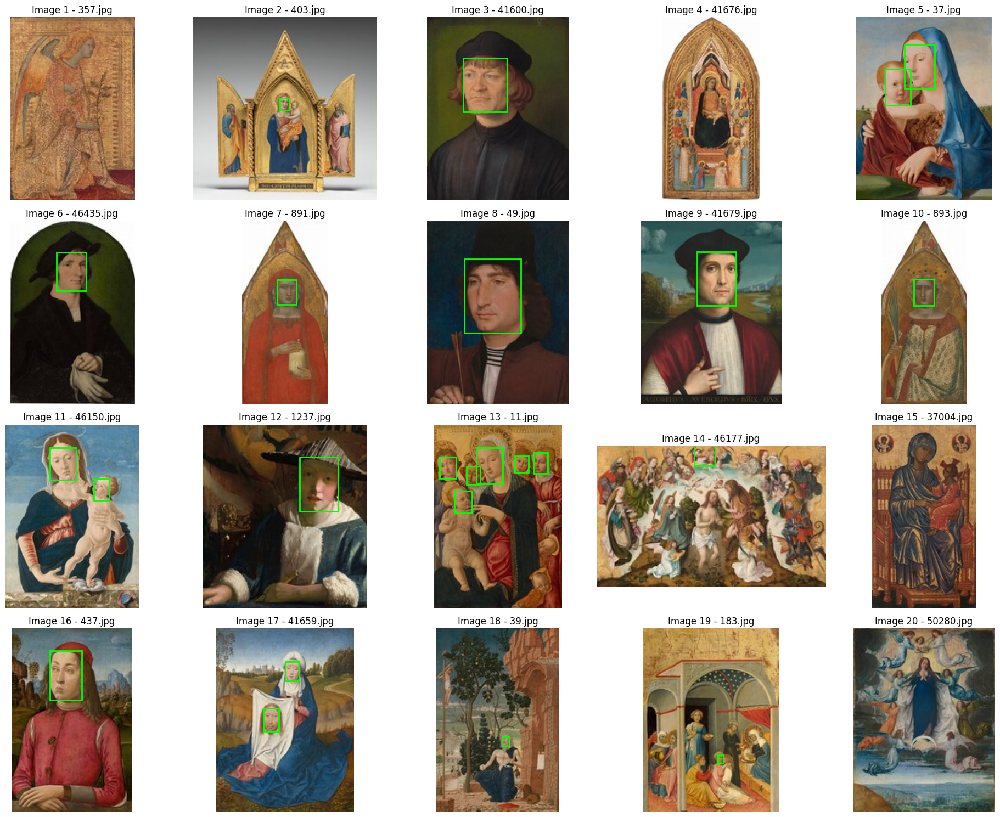

In [21]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import random
import os
from PIL import Image


def visualize_images_with_bounding_boxes_hybrid(image_paths, hybrid_model):
    """
    Visualize images with bounding boxes using Hybrid Model (MTCNN/DINOv2/CLIP)
    for primary face detection without RetinaFace fallback.
    """
    plt.figure(figsize=(20, 15))  # Increase width and height


    for i, image_path in enumerate(image_paths, start=1):
        img = Image.open(image_path).convert("RGB")

        # Use Hybrid Model to detect and extract faces
        faces = hybrid_model.extract_faces(img)

        
        rows = 4
        cols = 5
        plt.subplot(rows, cols, i)

        plt.imshow(img)
        plt.title(f"Image {i} - {os.path.basename(image_path)}")
        #plt.figure(figsize=(20, 15))  # Increase width and height

        # Get bounding boxes from MTCNN/Hybrid Model
        boxes, _ = hybrid_model.face_detector.detect(img)

        # Draw bounding boxes from the Hybrid Model
        if boxes is not None and len(boxes) > 0:
            for box in boxes:
                x_min, y_min, x_max, y_max = map(int, box)
                rect = patches.Rectangle(
                    (x_min, y_min),
                    x_max - x_min,
                    y_max - y_min,
                    linewidth=2,
                    edgecolor="lime",  # Green for Hybrid Model
                    facecolor="none",
                )
                plt.gca().add_patch(rect)
                plt.text(
                    x_min,
                    y_min - 5,
                    '',
                    color="lime",
                    fontsize=10,
                    weight="bold",
                )
        else:
            print(f"No faces detected by Hybrid Model for {os.path.basename(image_path)}")

        plt.axis("off")

    plt.tight_layout()
    plt.show()


# Sample and visualize random images
folder_path = "/kaggle/working/data/images"  # Change to your folder path
image_files = os.listdir(folder_path)
sample_images = random.sample(image_files, 20)

# Create list of image paths
image_paths = [os.path.join(folder_path, image_file) for image_file in sample_images]

# Visualize the images with bounding boxes using Hybrid Model only
print("Visualizing images with Hybrid Model...")
visualize_images_with_bounding_boxes_hybrid(image_paths, hybrid_face_sim)


# **More Painiting Similarity Visualization**

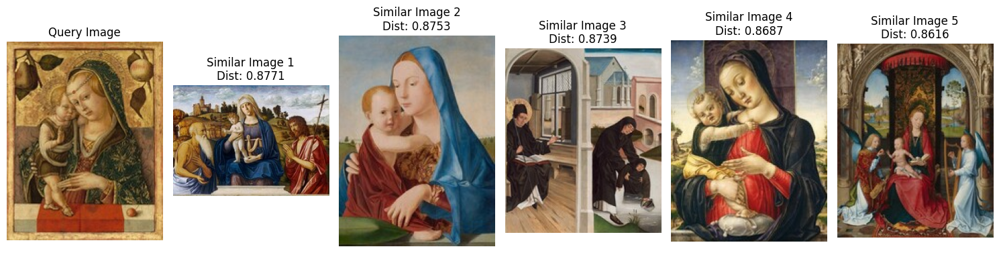

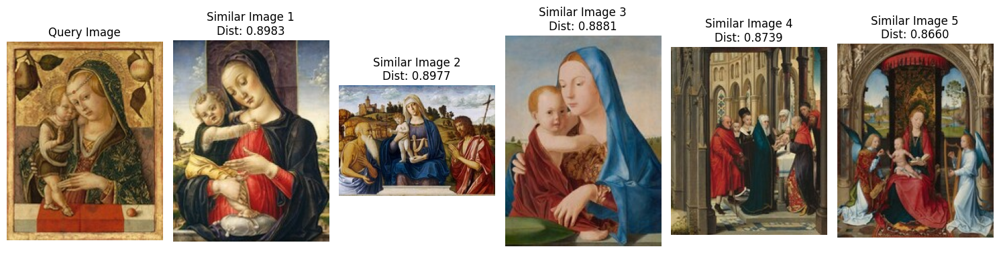

In [44]:
# Define the query image path
query_image1 = "./data/images/407.jpg"

# Retrieve similar images using the HybridImageRetrieval instance
similar_images1 = hybrid_img_general.retrieve_similar_images(query_image1, metric="cosine")

# Visualize the results
hybrid_img_general.visualize_results(similar_images1, query_image1)

# Retrieve similar images using the HybridImageRetrieval instance
similar_images1 = hybrid_img_face.retrieve_similar_images(query_image1, metric="cosine")

# Visualize the results
hybrid_img_face.visualize_results(similar_images1, query_image1)



General Similarity:


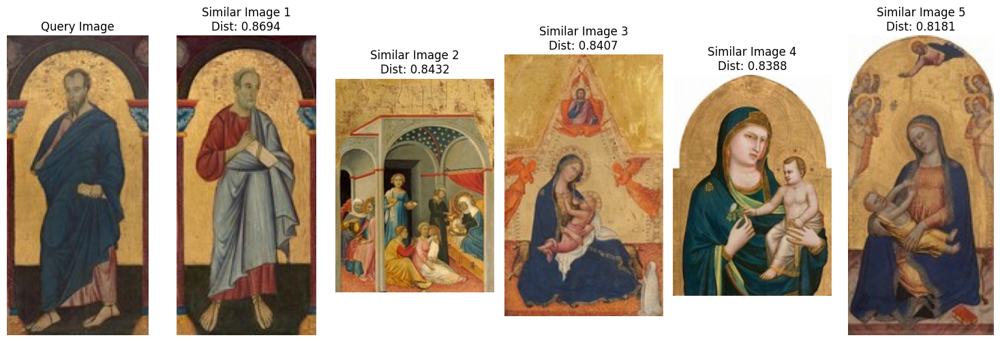

Face based Similarity:


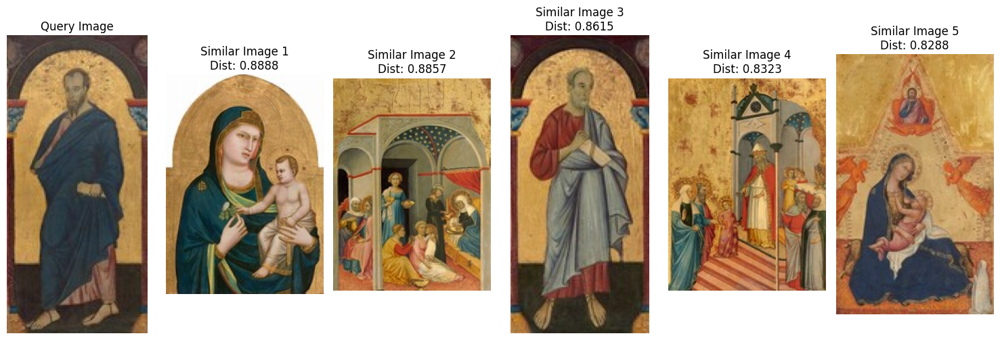

In [58]:
# Define the query image path
query_image1 = "./data/images/41625.jpg"

# Retrieve similar images using the HybridImageRetrieval instance
similar_images1 = hybrid_img_general.retrieve_similar_images(query_image1, metric="cosine")
print("General Similarity:")
# Visualize the results
hybrid_img_general.visualize_results(similar_images1, query_image1)

# Retrieve similar images using the HybridImageRetrieval instance
similar_images1 = hybrid_img_face.retrieve_similar_images(query_image1, metric="cosine")
print("Face based Similarity:")
# Visualize the results
hybrid_img_face.visualize_results(similar_images1, query_image1)


General Similarity:


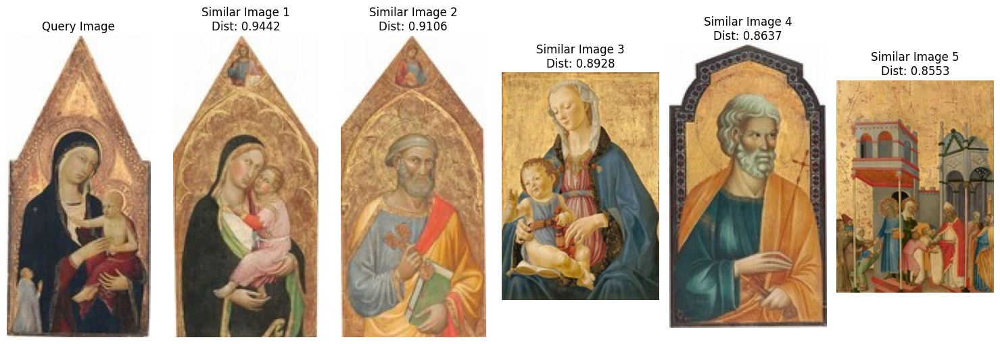

Face based Similarity:


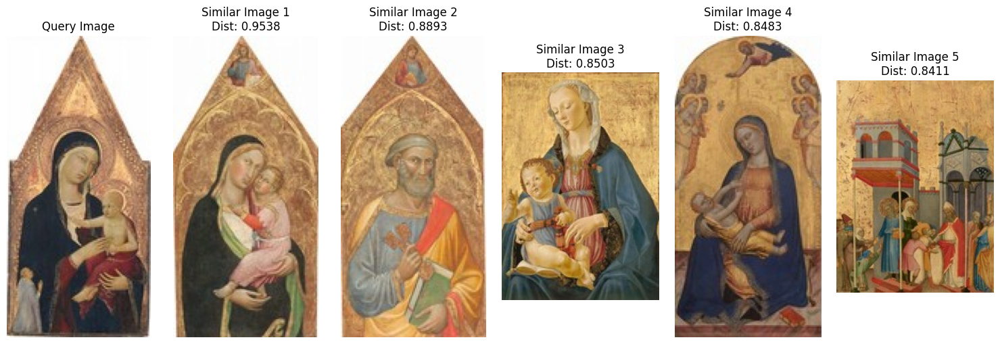

In [50]:
from PIL import Image

# Define the query image path
query_image_path = "./data/images/13.jpg"

# Open the image before passing it to extract_faces
image = Image.open(query_image_path).convert("RGB")

# Retrieve similar images using the HybridImageRetrieval instance
similar_images1 = hybrid_img_general.retrieve_similar_images(query_image_path, metric="cosine")
similar_images2 = hybrid_img_face.retrieve_similar_images(query_image_path, metric="cosine")

# Visualize the results
print("General Similarity:")
hybrid_img_general.visualize_results(similar_images1, query_image_path)
print("Face based Similarity:")
hybrid_img_face.visualize_results(similar_images2, query_image_path)